In [31]:

import numpy as np
import networkx as nx
import ot
import os
import matplotlib.pyplot as plt
import seaborn as sns
import random
# from EDRep import NodeEmbedding  
from functions import *
import pandas as pd
import glob
from nilearn import datasets
import itertools
from nilearn.connectome import ConnectivityMeasure


# from EDRep_main.EDRep import NodeEmbedding

Download of the files

In [32]:

abide = datasets.fetch_abide_pcp(
    data_dir=r'C:\Users\Utente\Desktop\progetto vscode\data\abide_data',   
    n_subjects=1112,            # number subjects
    pipeline='cpac',           
    derivatives=['rois_ho']    # atlante Harvard-Oxford 
)

#LABEL 
phenotypes = abide.phenotypic 


# time series
for timeseries in abide.rois_ho:
    print(timeseries.shape)

[fetch_abide_pcp] Dataset found in C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(196, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(206, 111)
(78, 111)
(78, 111)
(78, 111)
(78, 111)
(

In [33]:
def create_ABIDE_graph(file_name, min_timepoints=100):
    df = pd.read_csv(file_name, sep='\t')
    df.columns = [int(s[1:]) for s in df.columns]

    if len(df) < min_timepoints:
        return None

    conn_measure = ConnectivityMeasure(kind='correlation')
    W = conn_measure.fit_transform([df.values])[0]

    return np.maximum(W, 0)

In [34]:
def delete_nan(g):
    for line in g:
        for i in range(len(line)):
            if line[i]!= line[i]:
                line[i]=0
    return g

In [35]:
def node_embedding(g_a, partition_A, dim_embedding,seed=42):
    # save the seed state
    rdn_state = np.random.get_state()
    random.seed(seed)
    np.random.seed(seed)
    embedding_a = NodeEmbedding(g_a, dim=dim_embedding, k=1, verbose=False)
    X_total = embedding_a.X
    X_list = [X_total[list(nodes), :] for nodes in partition_A]
    np.random.set_state(rdn_state)
    return X_list



In [36]:
files_folder = r"C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\cpac\nofilt_noglobal"
names_files = os.listdir(files_folder)

def file_found(file_id_dataframe):
    file_id_str = str(file_id_dataframe)
    # see if this name is in the ffolder of the files
    return any(file_id_str in name for name in names_files)

In [37]:
def f_norm_opt(embx,emby):
    x=np.array([e[0] for e in embx])
    y=np.array([e[0] for e in emby])
    norm00=np.linalg.norm(x.T@x)
    norm11=np.linalg.norm(y.T@y)
    norm01=np.linalg.norm(x.T@y)
    finale_norm=np.sqrt(norm00**2+norm11**2-2*norm01**2)/np.sqrt(2)
    return finale_norm

In [38]:
partition=[[i] for i in range(111)]

In [39]:
folder = r"C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\cpac\nofilt_noglobal"
path_files = glob.glob(os.path.join(folder, "*.1D"))
all_graphs = []
loaded_files = []
skipped = 0
for file in path_files:
    g = create_ABIDE_graph(file)
    if g is not None:
        all_graphs.append(g)
        loaded_files.append(os.path.basename(file))
    else:
        skipped += 1
print(f"Loaded {len(all_graphs)} graphs, skipped {skipped} (< 100 timepoints)")

C:\Users\Utente\AppData\Local\Temp\ipykernel_21940\2881208625.py:9: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  W = conn_measure.fit_transform([df.values])[0]
C:\Users\Utente\AppData\Local\Temp\ipykernel_21940\2881208625.py:9: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize

Loaded 846 graphs, skipped 25 (< 100 timepoints)


C:\Users\Utente\AppData\Local\Temp\ipykernel_21940\2881208625.py:9: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  W = conn_measure.fit_transform([df.values])[0]
C:\Users\Utente\AppData\Local\Temp\ipykernel_21940\2881208625.py:9: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize

In [40]:
all_graphs_wo_nan=[]
for g in all_graphs:
    all_graphs_wo_nan.append(delete_nan(g))

Given that the partition are all the same I calculate only the one for the first graph

In [41]:
g0= all_graphs[0]
g1= all_graphs[1]

In [42]:
emb_0=node_embedding(g0,partition,16)
emb_1=node_embedding(g1,partition,16)

In [43]:
d01, vec01, data01 = w2_distance_classes(emb_0,emb_1)
print(d01)

26.55114357801737


In [44]:
f_norm_opt(emb_0,emb_1)

np.float64(26.551143578017367)

In [45]:
df_phenotipic = pd.read_csv(r"C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\Phenotypic_V1_0b_preprocessed1.csv")

def file_found_loaded(file_id):
    file_id_str = str(file_id)
    return any(file_id_str in name for name in loaded_files)

df_def = df_phenotipic[df_phenotipic['FILE_ID'].apply(file_found_loaded)]

In [46]:
dx_val = df_def['DX_GROUP'].tolist()
emb_list_control=[]
emb_list_autistic=[]

for g, dx in zip(all_graphs_wo_nan, dx_val):
    if dx == 1:
        # emb_1=node_embedding(g,partition,16)
        emb_1 = np.array(node_embedding(g,partition,32))[:,0,:]
        emb_list_control.append(emb_1)
    elif dx == 2:
        emb_2 = np.array(node_embedding(g,partition,32))[:,0,:]
        emb_list_autistic.append(emb_2)


print(len(emb_list_control))
print(len(emb_list_autistic))

391
455


In [47]:
X = np.concatenate([emb_list_control, emb_list_autistic])

n, _, _ = X.shape
D = np.zeros((n,n))

for i in range(n):
    for j in range(n):
        D[i,j] = f_norm_opt(X[i], X[j])

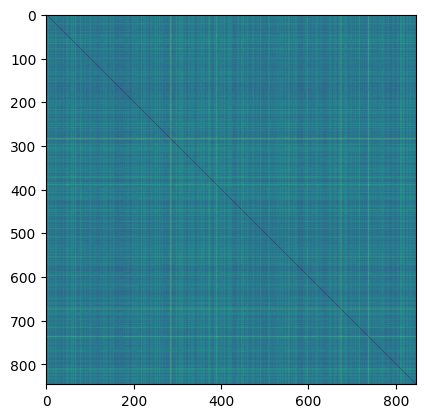

In [48]:
plt.imshow(D)

NYU

df_phenotipic = pd.read_csv(r"C:\Users\Utente\Desktop\progetto vscode\ABIDE\abide_data\ABIDE_pcp\Phenotypic_V1_0b_preprocessed1.csv")
df_NYU = df_phenotipic[df_phenotipic['SITE_ID'] == 'NYU']

# filter function
df_NYU_def = df_NYU[df_NYU['FILE_ID'].apply(file_found)]

print(f"NYU subjects for which I have files: {len(df_NYU_def)}")
print(df_NYU_def.head())

folder_nyu = r"C:\Users\Utente\Desktop\progetto vscode\ABIDE\abide_data\ABIDE_pcp\cpac\nyu"
path_files_nyu = glob.glob(os.path.join(folder_nyu, "*.1D"))
all_graphs_nyu=[]
for file in path_files_nyu:
    g_nyu=create_ABIDE_graph(file)
    all_graphs_nyu.append(g_nyu)
print(all_graphs_nyu)

all_graphs_nyu_wo_nan=[]
for g in all_graphs_nyu:
    all_graphs_nyu_wo_nan.append(delete_nan(g))
    
valori_dx = df_NYU_def['DX_GROUP'].tolist()
emb_list_control=[]
emb_list_autistic=[]

for g, dx in zip(all_graphs_nyu, valori_dx):
    if dx == 1:
        # emb_1=node_embedding(g,partition,16)
        emb_1 = np.array(node_embedding(abs(g),partition,32))[:,0,:]
        emb_list_control.append(emb_1)
    elif dx == 2:
        emb_2 = np.array(node_embedding(abs(g),partition,32))[:,0,:]
        emb_list_autistic.append(emb_2)


print(len(emb_list_control))
print(len(emb_list_autistic))

In [49]:
w2_list_control=[]
for a, b in itertools.combinations(emb_list_control, 2):
    d=f_norm_opt(a,b)
    w2_list_control.append(d)
print(w2_list_control)

[np.float64(3.0153631175644096), np.float64(3.232402704063073), np.float64(2.8361166316324837), np.float64(2.561235414256802), np.float64(3.16022329447175), np.float64(3.4497565812412816), np.float64(2.6588061132032283), np.float64(2.5596705099993153), np.float64(2.400513504227971), np.float64(3.128173931198022), np.float64(2.696720962248931), np.float64(2.2735232605619315), np.float64(3.3900661769700715), np.float64(2.896357527689174), np.float64(2.165626438264882), np.float64(2.6240913297261725), np.float64(2.9577610231228477), np.float64(2.2673777057527564), np.float64(2.2317574480140396), np.float64(2.25353092762552), np.float64(2.6002774146502112), np.float64(4.2049533986129255), np.float64(2.5430684682243263), np.float64(2.5966169631078015), np.float64(2.6390246315812718), np.float64(2.4582587125024067), np.float64(2.7384309371047797), np.float64(2.4321220346849306), np.float64(2.1304747608646886), np.float64(2.5821044913135083), np.float64(2.6899360035655193), np.float64(2.81559

In [50]:
print(max(w2_list_control))
print(min(w2_list_control))
print(np.mean(w2_list_control))

6.790327354602721
1.5558852022026481
3.0234866138970093


<function matplotlib.pyplot.show(close=None, block=None)>

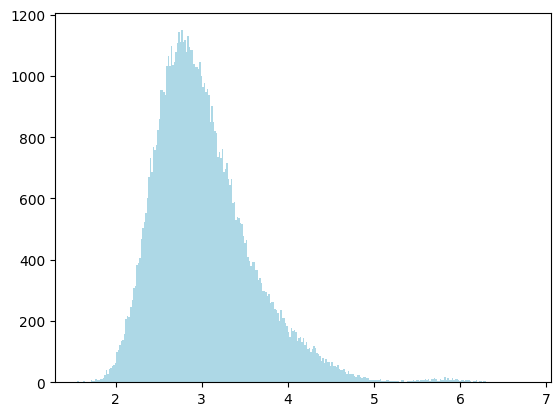

In [51]:
plt.hist(w2_list_control, bins=300, color='lightblue')
plt.show

In [52]:
w2_list_autistic=[]
for a, b in itertools.combinations(emb_list_autistic, 2):
    d=f_norm_opt(a,b)
    w2_list_autistic.append(d)
print(w2_list_autistic)

[np.float64(3.381615152527533), np.float64(2.8617993371929176), np.float64(2.634640378442379), np.float64(3.8669260885233125), np.float64(3.160111019487026), np.float64(3.212092082606822), np.float64(3.5060212526483285), np.float64(3.426722621311801), np.float64(3.3039889108205114), np.float64(2.8630933502845983), np.float64(4.200128018865479), np.float64(3.5895607690292843), np.float64(2.9603820415309006), np.float64(3.256042137474389), np.float64(3.0021640937396974), np.float64(3.2157674582562654), np.float64(4.168904120624186), np.float64(3.031905423881829), np.float64(3.3624861628789913), np.float64(3.885829006237715), np.float64(3.13789435508956), np.float64(2.9317127207852636), np.float64(3.3957069292273303), np.float64(3.7808970708123266), np.float64(3.52306783833353), np.float64(3.58361952024956), np.float64(3.272800860553887), np.float64(3.3750585181463304), np.float64(3.703723031980438), np.float64(2.781992166371515), np.float64(3.8024723855738607), np.float64(3.8548321663210

In [53]:

print(max(w2_list_autistic))
print(min(w2_list_autistic))
print(np.mean(w2_list_autistic))

6.9257258168926645
1.5266068578539436
3.014305936610273


<function matplotlib.pyplot.show(close=None, block=None)>

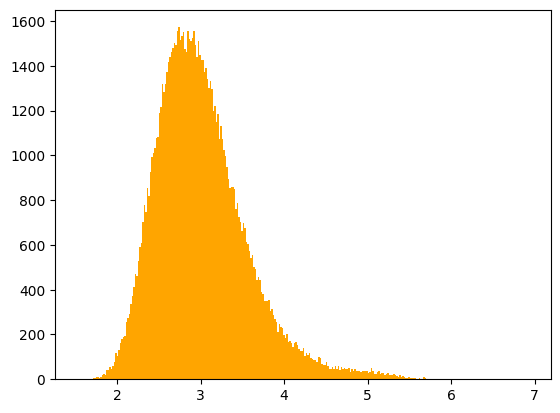

In [54]:
plt.hist(w2_list_autistic, bins=300, color='orange')
plt.show

In [55]:
w2_mix=[]
for control in emb_list_control:
    for autistic in emb_list_autistic:
        d=f_norm_opt(control,autistic)
        w2_mix.append(d)
print(w2_mix)

[np.float64(3.0877382925517938), np.float64(2.7339883012611805), np.float64(2.5115391478264675), np.float64(2.3960716314617754), np.float64(3.292900362108761), np.float64(2.290477582544828), np.float64(2.531565427239878), np.float64(3.0924311712864028), np.float64(2.7352050352787023), np.float64(3.3980167889250668), np.float64(2.4874892976493803), np.float64(3.0232264500797346), np.float64(2.9561863401196877), np.float64(2.0930218226885393), np.float64(2.8194894182509267), np.float64(2.0232397761916245), np.float64(3.6571256992897343), np.float64(3.896352687463217), np.float64(2.366940175497735), np.float64(2.479694557602633), np.float64(2.9580174326180937), np.float64(2.392486899626302), np.float64(2.0021865372498233), np.float64(2.38721535519895), np.float64(3.068827982367382), np.float64(2.8878206003336606), np.float64(2.8472808522043596), np.float64(3.146963694873993), np.float64(2.4603420690456956), np.float64(3.8607224322574623), np.float64(2.650008069787695), np.float64(3.060033

In [56]:
print(max(w2_mix))
print(min(w2_mix))
print(np.mean(w2_mix))

7.270789949224967
1.5341001610264717
3.0209934537596634


<function matplotlib.pyplot.show(close=None, block=None)>

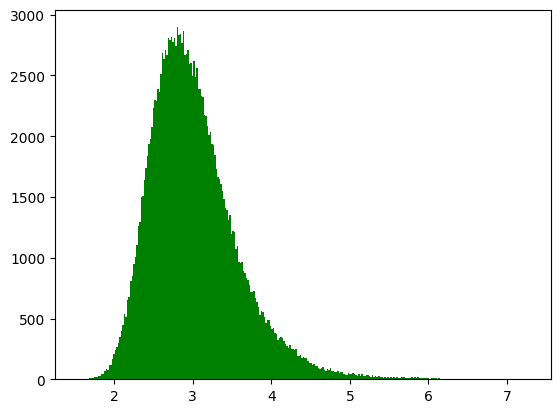

In [57]:
plt.hist(w2_mix, bins=300, color='green')
plt.show

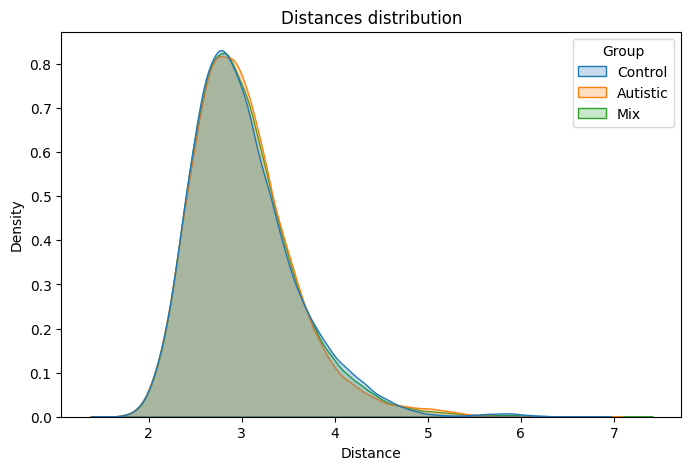

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

df_plot = pd.DataFrame({
    'Distance': w2_list_control + w2_list_autistic + w2_mix,
    'Group': ['Control'] * len(w2_list_control) + ['Autistic'] * len(w2_list_autistic) + ['Mix'] * len(w2_mix)
})

plt.figure(figsize=(8, 5))
sns.kdeplot(data=df_plot, x='Distance', hue='Group', fill=True, common_norm=False)
plt.title("Distances distribution")
plt.show()


## Comparison across connectivity types: correlation, partial correlation, tangent

In [59]:
# Load raw time series once (shared across all connectivity types)
folder = r"C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\cpac\nofilt_noglobal"

timeseries_all = []
filenames_all = []
skipped = 0

for file in sorted(glob.glob(os.path.join(folder, "*.1D"))):
    df = pd.read_csv(file, sep='\t')
    df.columns = [int(s[1:]) for s in df.columns]
    if len(df) < 100:
        skipped += 1
        continue
    timeseries_all.append(df.values.astype(float))
    filenames_all.append(os.path.basename(file))

# Align labels to filenames (explicit per-filename lookup to avoid CSV row order mismatch)
df_ph = pd.read_csv(r"C:\Users\Utente\Desktop\progetto vscode\data\abide_data\ABIDE_pcp\Phenotypic_V1_0b_preprocessed1.csv")
id_to_dx = {str(row['FILE_ID']): row['DX_GROUP'] for _, row in df_ph.iterrows()}

dx_all = []
for fname in filenames_all:
    matched = [dx for fid, dx in id_to_dx.items() if fid in fname]
    dx_all.append(matched[0] if matched else None)

# Drop subjects with no label found in phenotypic CSV
valid = [(ts, dx) for ts, dx in zip(timeseries_all, dx_all) if dx is not None]
timeseries_all, dx_all = zip(*valid)
timeseries_all = list(timeseries_all)
dx_all = list(dx_all)

print(f"Loaded {len(timeseries_all)} subjects, skipped {skipped} (< 100 tp)")
print(f"Controls: {dx_all.count(1)}, Autistic: {dx_all.count(2)}")

Loaded 846 subjects, skipped 25 (< 100 tp)
Controls: 391, Autistic: 455


In [60]:
def run_analysis_by_kind(timeseries_list, dx_labels, kind='correlation', dim=32, seed=42):
    """
    Computes node embeddings and pairwise f_norm distances for a given connectivity type.

    Connectivity kinds:
      'correlation'         - Pearson correlation, keeps only positive weights
      'partial correlation' - partial correlation, keeps only positive weights
      'tangent'             - deviation from group mean (absolute value for non-negativity)

    Returns:
      d_cc: list of distances between control pairs
      d_aa: list of distances between autistic pairs
      d_ca: list of distances between control-autistic pairs
    """
    conn_measure = ConnectivityMeasure(kind=kind)
    matrices = conn_measure.fit_transform(timeseries_list)

    if kind == 'tangent':
        graphs = [np.abs(m) for m in matrices]
    else:
        graphs = [np.maximum(m, 0) for m in matrices]

    graphs = [delete_nan(g) for g in graphs]

    n_rois = matrices[0].shape[0]
    part = [[i] for i in range(n_rois)]

    emb_control, emb_autistic = [], []
    for g, dx in zip(graphs, dx_labels):
        emb = np.array(node_embedding(g, part, dim, seed=seed))[:, 0, :]
        if dx == 1:
            emb_control.append(emb)
        elif dx == 2:
            emb_autistic.append(emb)

    print(f"  controls={len(emb_control)}, autistic={len(emb_autistic)}")

    d_cc = [f_norm_opt(a, b) for a, b in itertools.combinations(emb_control, 2)]
    d_aa = [f_norm_opt(a, b) for a, b in itertools.combinations(emb_autistic, 2)]
    d_ca = [f_norm_opt(c, a) for c in emb_control for a in emb_autistic]

    return d_cc, d_aa, d_ca

In [61]:
kinds = ['correlation', 'partial correlation', 'tangent']
results = {}

for kind in kinds:
    print(f"\nRunning: {kind} ...")
    d_cc, d_aa, d_ca = run_analysis_by_kind(timeseries_all, dx_all, kind=kind, dim=32)
    results[kind] = {'control': d_cc, 'autistic': d_aa, 'mix': d_ca}
    print(f"  mean CC={np.mean(d_cc):.3f}  AA={np.mean(d_aa):.3f}  CA={np.mean(d_ca):.3f}")
    within = np.mean(d_cc + d_aa)
    sep = np.mean(d_ca) / within
    print(f"  separability ratio (mix/within): {sep:.3f}")


Running: correlation ...


C:\Users\Utente\AppData\Local\Temp\ipykernel_21940\4084792488.py:16: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using standardize=True will fall back to 'zscore_sample'.To avoid this warning, please use 'zscore_sample' instead.
  matrices = conn_measure.fit_transform(timeseries_list)
C:\Users\Utente\AppData\Local\Temp\ipykernel_21940\4084792488.py:16: FutureWarning: The default strategy for standardize is currently 'zscore' which incorrectly uses population std to calculate sample zscores. The new strategy 'zscore_sample' corrects this behavior by using the sample std. In release 0.14.0, the default strategy will be replaced by the new strategy, the 'zscore' option will be removed. and using s

  controls=391, autistic=455
  mean CC=2.973  AA=3.057  CA=3.018
  separability ratio (mix/within): 0.999

Running: partial correlation ...
  controls=391, autistic=455
  mean CC=3.268  AA=3.265  CA=3.267
  separability ratio (mix/within): 1.000

Running: tangent ...
  controls=391, autistic=455
  mean CC=3.358  AA=3.345  CA=3.352
  separability ratio (mix/within): 1.000


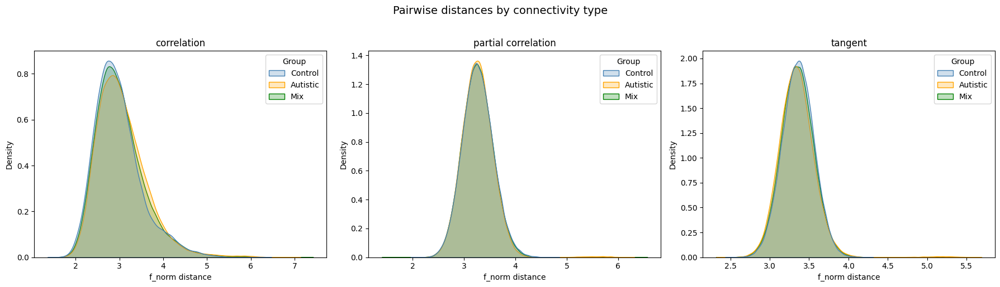

In [62]:
fig, axes = plt.subplots(1, len(kinds), figsize=(6 * len(kinds), 5), sharey=False)

for ax, kind in zip(axes, kinds):
    d = results[kind]
    df_plot = pd.DataFrame({
        'Distance': d['control'] + d['autistic'] + d['mix'],
        'Group': (['Control'] * len(d['control']) +
                  ['Autistic'] * len(d['autistic']) +
                  ['Mix'] * len(d['mix']))
    })
    sns.kdeplot(data=df_plot, x='Distance', hue='Group',
                fill=True, common_norm=False, ax=ax,
                palette={'Control': 'steelblue', 'Autistic': 'orange', 'Mix': 'green'})
    ax.set_title(kind)
    ax.set_xlabel('f_norm distance')

plt.suptitle('Pairwise distances by connectivity type', fontsize=14, y=1.02)
plt.tight_layout()
plt.show()